# viewing the data

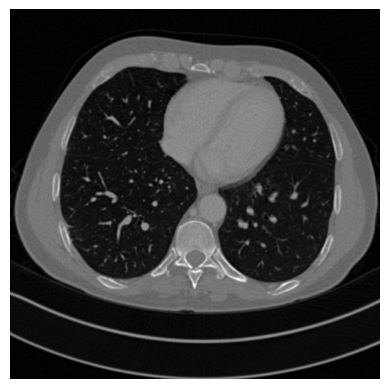

In [1]:
import pydicom
import matplotlib.pyplot as plt

# Path to your DICOM file
dicom_file = '/kaggle/input/mayo-dataset/full_1mm/L067/full_1mm/L067_FD_1_1.CT.0001.0001.2015.12.22.18.09.40.840353.358074219.IMA'

# Load the DICOM file
dicom_data = pydicom.dcmread(dicom_file)

# Extract the pixel data from the DICOM file
image_data = dicom_data.pixel_array

# Display the image
plt.imshow(image_data, cmap='gray')
plt.axis('off')  # Turn off axis
plt.show()


In [3]:
!pip install pydicom matplotlib imageio
!pip install imageio==2.19.3
!pip install imageio-ffmpeg==0.4.7

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 30.3 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: imageio
    Found existing installation: imageio 2.34.1
    Uninstalling imageio-2.34.1:
      Successfully uninstalled imageio-2.34.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scikit-image 0.23.2 requires imageio>=2.33, but you have imageio 2.19.3 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 61.4 MB/s eta 0:00:00:00:0100:01


In [4]:
import os
import pydicom
import numpy as np
import imageio
import glob

# Directory containing the DICOM files
dicom_dir = '/kaggle/input/mayo-dataset/full_1mm/L067/full_1mm/'

# Directory to save PNG images
png_dir = '/kaggle/working/png_images/'
os.makedirs(png_dir, exist_ok=True)  # Create directory if it doesn't exist

# Get all DICOM file paths from the directory
dicom_files = sorted([os.path.join(dicom_dir, f) for f in os.listdir(dicom_dir) if f.endswith('.IMA')])

# Read and store each DICOM image as PNG
for i, dicom_file in enumerate(dicom_files):
    dicom_data = pydicom.dcmread(dicom_file)
    image = dicom_data.pixel_array
    
    # Normalize the image data to 8-bit (0-255)
    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image)) * 255
    normalized_image = normalized_image.astype(np.uint8)  # Convert to 8-bit
    
    # Save as PNG
    png_file = os.path.join(png_dir, f'image_{i:03d}.png')  # Use zero-padding for filenames
    imageio.imwrite(png_file, normalized_image)

# Create a video from the saved PNG files
video_file = 'ct_scan_animation.mp4'
writer = imageio.get_writer(video_file, fps=80)

# Use glob to find all the PNG files
for file in sorted(glob.glob(os.path.join(png_dir, 'image_*.png'))):
    im = imageio.imread(file)
    writer.append_data(im)

writer.close()

# Notify the user
print(f"Video saved as {video_file}")


/tmp/ipykernel_30/2487559515.py:36: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(file)


Video saved as ct_scan_animation.mp4


In [5]:
from IPython.display import Video
Video('ct_scan_animation.mp4')


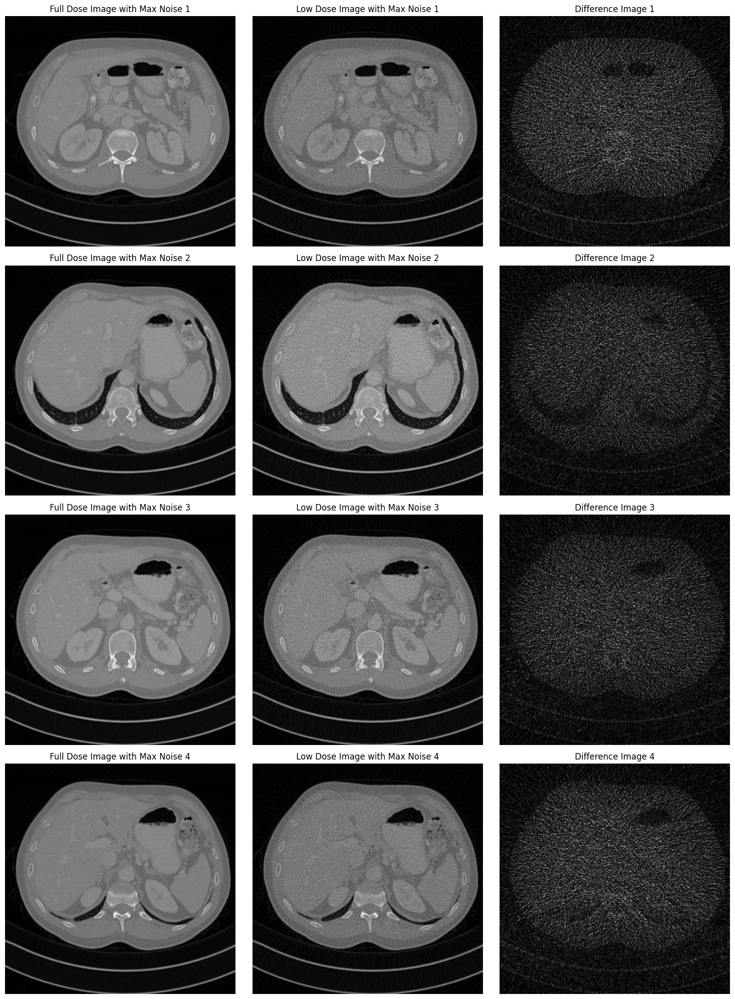

In [5]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt

# Define directories for full-dose and low-dose images for patient L067
full_dose_dir = '/kaggle/input/mayo-dataset/full_1mm/L067/full_1mm/'
low_dose_dir = '/kaggle/input/mayo-dataset/quarter_1mm/L067/quarter_1mm/'

# Get the full dose and low dose filenames
full_dose_files = sorted([f for f in os.listdir(full_dose_dir) if f.endswith('.IMA')])
low_dose_files = sorted([f for f in os.listdir(low_dose_dir) if f.endswith('.IMA')])

# Prepare for comparison
noise_values = []

# Load images and calculate noise
for full_file, low_file in zip(full_dose_files, low_dose_files):
    # Full-dose image
    full_dose_image = pydicom.dcmread(os.path.join(full_dose_dir, full_file)).pixel_array

    # Low-dose image
    low_dose_image = pydicom.dcmread(os.path.join(low_dose_dir, low_file)).pixel_array

    # Normalize images for better visual quality
    full_dose_image_normalized = (full_dose_image - np.min(full_dose_image)) / (np.max(full_dose_image) - np.min(full_dose_image))
    low_dose_image_normalized = (low_dose_image - np.min(low_dose_image)) / (np.max(low_dose_image) - np.min(low_dose_image))

    # Calculate the difference image (normalized)
    difference_image = np.abs(full_dose_image_normalized - low_dose_image_normalized)

    # Sum of differences to measure noise level
    noise_value = np.sum(difference_image)
    noise_values.append((noise_value, full_dose_image_normalized, low_dose_image_normalized))

# Sort noise values to find the top noisy images
top_noisy_images = sorted(noise_values, key=lambda x: x[0], reverse=True)[:4]

# Plot the comparisons for the images with maximum noise
num_comparisons = len(top_noisy_images)
fig, axs = plt.subplots(num_comparisons, 3, figsize=(15, 5 * num_comparisons))

for i, (noise, full_img, low_img) in enumerate(top_noisy_images):
    # Convert normalized images to 8-bit for display
    full_img_display = (full_img * 255).astype(np.uint8)
    low_img_display = (low_img * 255).astype(np.uint8)

    axs[i, 0].imshow(full_img_display, cmap='gray')
    axs[i, 0].set_title(f'Full Dose Image with Max Noise {i + 1}')
    axs[i, 0].axis('off')  # Hide axis

    axs[i, 1].imshow(low_img_display, cmap='gray')
    axs[i, 1].set_title(f'Low Dose Image with Max Noise {i + 1}')
    axs[i, 1].axis('off')  # Hide axis

    # Calculate and display the difference image for visualization
    difference_image_display = (np.abs(full_img - low_img) * 255).astype(np.uint8)
    axs[i, 2].imshow(difference_image_display, cmap='gray')
    axs[i, 2].set_title(f'Difference Image {i + 1}')
    axs[i, 2].axis('off')  # Hide axis

plt.tight_layout()
plt.show()


In [6]:
import os
import pydicom
import numpy as np

# List of patient identifiers
patients = ['L067', 'L096', 'L109', 'L143', 'L192', 'L286', 'L291', 'L310', 'L333', 'L506']

# Define directories for full-dose and low-dose images
full_dose_base_dir = '/kaggle/input/mayo-dataset/full_1mm/'
low_dose_base_dir = '/kaggle/input/mayo-dataset/quarter_1mm/'

# Prepare to hold noise values for all patients
noise_results = []

# Loop through each patient
for patient in patients:
    full_dose_dir = os.path.join(full_dose_base_dir, patient, 'full_1mm/')
    low_dose_dir = os.path.join(low_dose_base_dir, patient, 'quarter_1mm/')
    
    # Get the full dose and low dose filenames
    full_dose_files = sorted([f for f in os.listdir(full_dose_dir) if f.endswith('.IMA')])
    low_dose_files = sorted([f for f in os.listdir(low_dose_dir) if f.endswith('.IMA')])
    
    # Load images and calculate noise for each pair
    for full_file, low_file in zip(full_dose_files, low_dose_files):
        # Full-dose image
        full_dose_image = pydicom.dcmread(os.path.join(full_dose_dir, full_file)).pixel_array

        # Low-dose image
        low_dose_image = pydicom.dcmread(os.path.join(low_dose_dir, low_file)).pixel_array

        # Normalize images for better visual quality
        full_dose_image_normalized = (full_dose_image - np.min(full_dose_image)) / (np.max(full_dose_image) - np.min(full_dose_image))
        low_dose_image_normalized = (low_dose_image - np.min(low_dose_image)) / (np.max(low_dose_image) - np.min(low_dose_image))

        # Calculate the difference image (normalized)
        difference_image = np.abs(full_dose_image_normalized - low_dose_image_normalized)

        # Sum of differences to measure noise level
        noise_value = np.sum(difference_image)

        # Store the patient ID, filenames, and noise value
        noise_results.append((patient, full_file, low_file, noise_value))

# Sort noise values to find the top noisy images for each patient
top_noisy_per_patient = {}
for result in noise_results:
    patient, full_file, low_file, noise_value = result
    if patient not in top_noisy_per_patient:
        top_noisy_per_patient[patient] = []
    top_noisy_per_patient[patient].append((full_file, low_file, noise_value))

# Find the top noisy image for each patient
top_images_per_patient = []
for patient, results in top_noisy_per_patient.items():
    # Sort and get the most noisy image for the current patient
    most_noisy = sorted(results, key=lambda x: x[2], reverse=True)[:1]
    top_images_per_patient.extend(most_noisy)

# Now find the overall top 3 noisy images among the top ones
overall_top_images = sorted(top_images_per_patient, key=lambda x: x[2], reverse=True)[:3]

# Display the results
for idx, (full_file, low_file, noise_value) in enumerate(overall_top_images):
    print(f"Top {idx + 1} Noise Level: {noise_value:.2f}")
    print(f"Full Dose File: {full_file}")
    print(f"Low Dose File: {low_file}")
    print()


Top 1 Noise Level: 7655.15
Full Dose File: L143_FD_1_1.CT.0002.0379.2015.12.22.20.19.02.368428.358575940.IMA
Low Dose File: L143_QD_1_1.CT.0004.0379.2015.12.22.20.45.11.504991.358770654.IMA

Top 2 Noise Level: 7290.43
Full Dose File: L310_FD_1_1.CT.0001.0128.2015.12.22.18.00.49.960270.358106713.IMA
Low Dose File: L310_QD_1_1.CT.0003.0128.2015.12.22.18.04.55.889861.358252290.IMA

Top 3 Noise Level: 6620.82
Full Dose File: L291_FD_1_1.CT.0004.0021.2015.12.23.17.44.03.601192.127684203.IMA
Low Dose File: L291_QD_1_1.CT.0002.0021.2015.12.23.17.46.11.49176.127610149.IMA



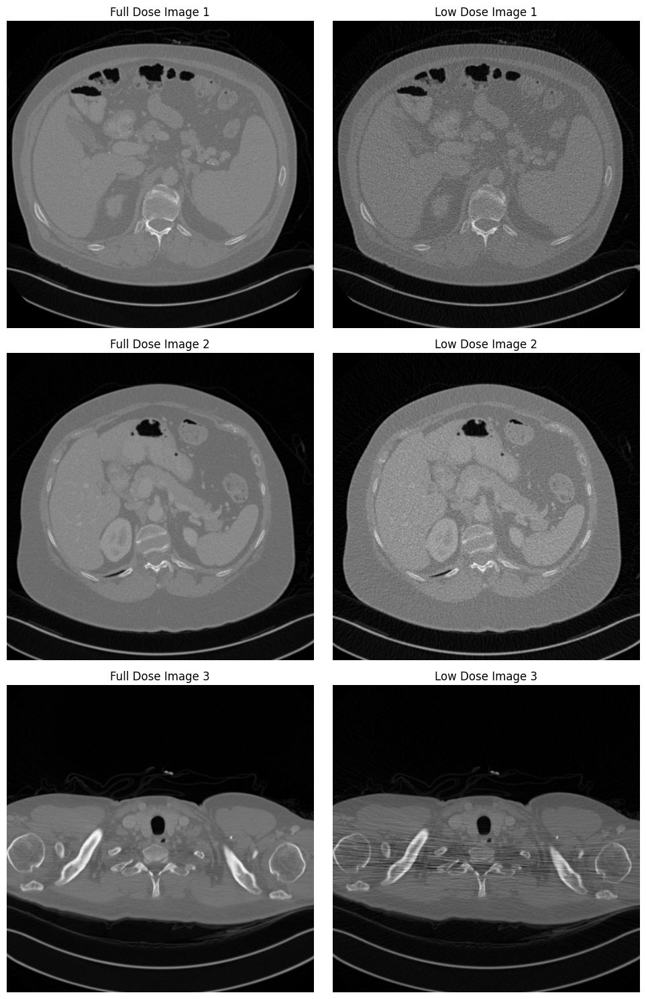

In [7]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt

# Define directories for full-dose and low-dose images based on patient IDs
full_dose_base_dir = '/kaggle/input/mayo-dataset/full_1mm/'
low_dose_base_dir = '/kaggle/input/mayo-dataset/quarter_1mm/'

# Top 3 noisy image pairs
top_images = [
    ('L143_FD_1_1.CT.0002.0379.2015.12.22.20.19.02.368428.358575940.IMA', 
     'L143_QD_1_1.CT.0004.0379.2015.12.22.20.45.11.504991.358770654.IMA'),
    
    ('L310_FD_1_1.CT.0001.0128.2015.12.22.18.00.49.960270.358106713.IMA', 
     'L310_QD_1_1.CT.0003.0128.2015.12.22.18.04.55.889861.358252290.IMA'),
    
    ('L291_FD_1_1.CT.0004.0021.2015.12.23.17.44.03.601192.127684203.IMA', 
     'L291_QD_1_1.CT.0002.0021.2015.12.23.17.46.11.49176.127610149.IMA')
]

# Prepare for comparison
comparisons = []

# Load and normalize images
for full_file, low_file in top_images:
    # Construct the full paths for the images
    full_dose_dir = os.path.join(full_dose_base_dir, full_file[:4], 'full_1mm/')
    low_dose_dir = os.path.join(low_dose_base_dir, low_file[:4], 'quarter_1mm/')
    
    # Load full-dose image
    full_dose_image = pydicom.dcmread(os.path.join(full_dose_dir, full_file)).pixel_array

    # Load low-dose image
    low_dose_image = pydicom.dcmread(os.path.join(low_dose_dir, low_file)).pixel_array

    # Normalize images for better visual quality
    full_dose_image_normalized = (full_dose_image - np.min(full_dose_image)) / (np.max(full_dose_image) - np.min(full_dose_image))
    low_dose_image_normalized = (low_dose_image - np.min(low_dose_image)) / (np.max(low_dose_image) - np.min(low_dose_image))

    # Convert normalized images to 8-bit for display
    full_dose_image_display = (full_dose_image_normalized * 255).astype(np.uint8)
    low_dose_image_display = (low_dose_image_normalized * 255).astype(np.uint8)

    # Store the images for comparison
    comparisons.append((full_dose_image_display, low_dose_image_display))

# Plot the comparisons
num_comparisons = len(comparisons)
fig, axs = plt.subplots(num_comparisons, 2, figsize=(10, 5 * num_comparisons))

for i, (full_img, low_img) in enumerate(comparisons):
    axs[i, 0].imshow(full_img, cmap='gray')
    axs[i, 0].set_title(f'Full Dose Image {i + 1}')
    axs[i, 0].axis('off')  # Hide axis

    axs[i, 1].imshow(low_img, cmap='gray')
    axs[i, 1].set_title(f'Low Dose Image {i + 1}')
    axs[i, 1].axis('off')  # Hide axis

plt.tight_layout()
plt.show()


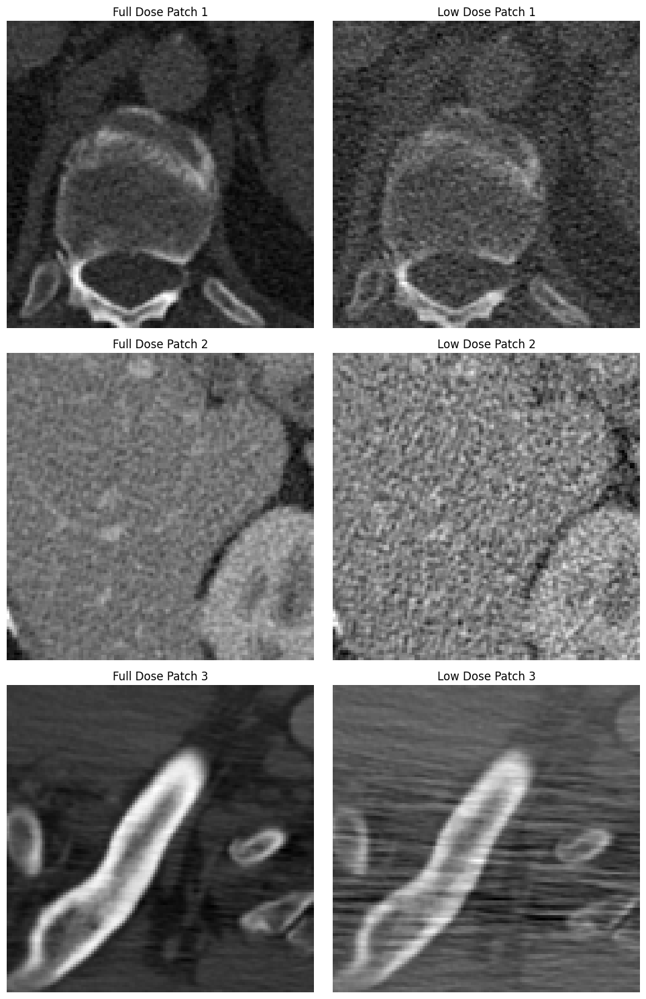

In [8]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt

# Define base directories for full-dose and low-dose images
full_dose_base_dir = '/kaggle/input/mayo-dataset/full_1mm/'
low_dose_base_dir = '/kaggle/input/mayo-dataset/quarter_1mm/'

# Top 3 noisy image pairs
top_images = [
    ('L143_FD_1_1.CT.0002.0379.2015.12.22.20.19.02.368428.358575940.IMA', 
     'L143_QD_1_1.CT.0004.0379.2015.12.22.20.45.11.504991.358770654.IMA'),
    
    ('L310_FD_1_1.CT.0001.0128.2015.12.22.18.00.49.960270.358106713.IMA', 
     'L310_QD_1_1.CT.0003.0128.2015.12.22.18.04.55.889861.358252290.IMA'),
    
    ('L291_FD_1_1.CT.0004.0021.2015.12.23.17.44.03.601192.127684203.IMA', 
     'L291_QD_1_1.CT.0002.0021.2015.12.23.17.46.11.49176.127610149.IMA')
]

# Patch size
patch_size = 120

# Function to calculate the noise for each 51x51 patch
def calculate_patch_noise(full_img, low_img, patch_size):
    max_noise = -1
    max_coords = (0, 0)

    # Loop over patches
    for i in range(full_img.shape[0] - patch_size + 1):
        for j in range(full_img.shape[1] - patch_size + 1):
            # Extract 51x51 patches
            full_patch = full_img[i:i+patch_size, j:j+patch_size]
            low_patch = low_img[i:i+patch_size, j:j+patch_size]
            
            # Calculate the noise (sum of absolute differences)
            noise = np.sum(np.abs(full_patch - low_patch))
            
            # Track the patch with the most noise
            if noise > max_noise:
                max_noise = noise
                max_coords = (i, j)
    
    return max_coords, max_noise

# Prepare to store and display the patches with most noise
comparison_patches = []

# Load, calculate noise, and extract the patch with maximum noise for each pair
for full_file, low_file in top_images:
    # Construct full paths for full-dose and low-dose images
    full_dose_dir = os.path.join(full_dose_base_dir, full_file[:4], 'full_1mm/')
    low_dose_dir = os.path.join(low_dose_base_dir, low_file[:4], 'quarter_1mm/')
    
    # Load full-dose and low-dose images
    full_dose_image = pydicom.dcmread(os.path.join(full_dose_dir, full_file)).pixel_array
    low_dose_image = pydicom.dcmread(os.path.join(low_dose_dir, low_file)).pixel_array

    # Normalize images for fair comparison
    full_dose_image_normalized = (full_dose_image - np.min(full_dose_image)) / (np.max(full_dose_image) - np.min(full_dose_image))
    low_dose_image_normalized = (low_dose_image - np.min(low_dose_image)) / (np.max(low_dose_image) - np.min(low_dose_image))

    # Identify the patch with the most noise
    (x, y), max_noise = calculate_patch_noise(full_dose_image_normalized, low_dose_image_normalized, patch_size)
    
    # Extract the 51x51 patches from both images
    full_patch = full_dose_image[x:x+patch_size, y:y+patch_size]
    low_patch = low_dose_image[x:x+patch_size, y:y+patch_size]

    # Store the patches for comparison
    comparison_patches.append((full_patch, low_patch, max_noise))

# Display the patches
num_comparisons = len(comparison_patches)
fig, axs = plt.subplots(num_comparisons, 2, figsize=(10, 5 * num_comparisons))

for i, (full_patch, low_patch, noise) in enumerate(comparison_patches):
    axs[i, 0].imshow(full_patch, cmap='gray')
    axs[i, 0].set_title(f'Full Dose Patch {i + 1}')
    axs[i, 0].axis('off')  # Hide axis

    axs[i, 1].imshow(low_patch, cmap='gray')
    axs[i, 1].set_title(f'Low Dose Patch {i + 1}')
    axs[i, 1].axis('off')  # Hide axis

plt.tight_layout()
plt.show()


# Processing Data and Training the Model

In [9]:
!pip install torch torchvision pydicom scikit-image matplotlib



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.4/315.4 kB 5.8 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: imageio
    Found existing installation: imageio 2.19.3
    Uninstalling imageio-2.19.3:
      Successfully uninstalled imageio-2.19.3


In [10]:
import torch.nn as nn

# Define the model
class model_v1(nn.Module):
    def __init__(self):
        super(model_v1, self).__init__()
        
        # Encoder: Convolutional layers
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(96, 96, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(96, 96, kernel_size=5, padding=2),
            nn.ReLU(),
        )
        
        # Decoder: Deconvolutional layers
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(96, 96, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.ConvTranspose2d(96, 96, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.ConvTranspose2d(96, 1, kernel_size=5, padding=2),
        )
        
        # Residual connection
        self.residual = nn.Identity()

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded + self.residual(x)

In [11]:
import torch
# Check the number of available GPUs
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_gpus = torch.cuda.device_count()
print(f"Number of available GPUs: {num_gpus}")

# Instantiate the model
model = model_v1()

# # If multiple GPUs are available, use DataParallel
# if num_gpus > 1:
#     print("Using DataParallel for multi-GPU training")
#     model = nn.DataParallel(model)

# Move the model to GPU (or the appropriate device)
model = model.to(device)

Number of available GPUs: 2


In [12]:
# Define loss and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

In [13]:
import os
import pydicom
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from skimage.util import view_as_windows
import matplotlib.pyplot as plt
import torch.nn as nn

class CTDataset(Dataset):
    def __init__(self, patient_ids, full_dose_base_dir, low_dose_base_dir, patch_size=64, stride=64):
        self.patient_ids = patient_ids
        self.full_dose_base_dir = full_dose_base_dir
        self.low_dose_base_dir = low_dose_base_dir
        self.patch_size = patch_size
        self.stride = stride
        self.patches = self.load_all_patches()

    def load_all_patches(self):
        patches = []
        for patient_id in self.patient_ids:
            full_dose_dir = os.path.join(self.full_dose_base_dir, patient_id, 'full_1mm/')
            low_dose_dir = os.path.join(self.low_dose_base_dir, patient_id, 'quarter_1mm/')
            
            full_dose_files = sorted([f for f in os.listdir(full_dose_dir) if f.endswith('.IMA')])
            low_dose_files = sorted([f for f in os.listdir(low_dose_dir) if f.endswith('.IMA')])
            
            for full_file, low_file in zip(full_dose_files, low_dose_files):
                full_image = self.load_dicom(os.path.join(full_dose_dir, full_file))
                low_image = self.load_dicom(os.path.join(low_dose_dir, low_file))
                patches.extend(self.extract_paired_patches(low_image, full_image))
        return patches

    def load_dicom(self, dicom_path):
        dicom_data = pydicom.dcmread(dicom_path)
        pixel_array = dicom_data.pixel_array
        normalized_image = (pixel_array - np.min(pixel_array)) / (np.max(pixel_array) - np.min(pixel_array))
        return normalized_image

    def extract_patches(self, image):
        patches = view_as_windows(image, (self.patch_size, self.patch_size), step=self.stride)
        patches = patches.reshape(-1, self.patch_size, self.patch_size)
        return patches

    def extract_paired_patches(self, low_image, full_image):
        low_patches = self.extract_patches(low_image)
        full_patches = self.extract_patches(full_image)
        return list(zip(low_patches, full_patches))

    def __len__(self):
        return len(self.patches)

    def __getitem__(self, idx):
        low_patch, full_patch = self.patches[idx]
        return torch.tensor(low_patch).unsqueeze(0).float(), torch.tensor(full_patch).unsqueeze(0).float()

# Define paths
full_dose_base_dir = '/kaggle/input/mayo-dataset/full_1mm/'
low_dose_base_dir = '/kaggle/input/mayo-dataset/quarter_1mm/'
patients = ['L067', 'L096']

# Create the dataset
ct_dataset = CTDataset(patients, full_dose_base_dir, low_dose_base_dir)

# Create DataLoader
train_loader = DataLoader(ct_dataset, batch_size=32, shuffle=True, num_workers=4, pin_memory=True)

# Load the model or Train

In [ ]:
from tqdm import tqdm

# Training loop
num_epochs = 10  # Set the number of epochs

for epoch in range(num_epochs):
    model.train()  # Set model to training mode
    running_loss = 0.0
    
    # Create a progress bar for the epoch
    progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch')
    
    for low_batch, full_batch in progress_bar:
        low_batch, full_batch = low_batch.to(device), full_batch.to(device)
        
        # Forward pass
        outputs = model(low_batch)
        loss = criterion(outputs, full_batch)
        
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Update progress bar description
        progress_bar.set_postfix({'loss': f'{loss.item():.8f}'})
    
    # Print average loss for the epoch
    epoch_loss = running_loss / len(train_loader)
    print(f'Epoch [{epoch+1}/{num_epochs}], Average Loss: {epoch_loss:.8f}')


In [18]:
# Visualization Function
def visualize_denoised_images(model, data_loader, num_images=5):
    model.eval()  # Set model to evaluation mode
    
    with torch.no_grad():
        for low_batch, full_batch in data_loader:
            low_batch, full_batch = low_batch.to(device), full_batch.to(device)
            outputs = model(low_batch)  # Generate denoised images
            low_batch = low_batch.cpu().numpy()
            outputs = outputs.cpu().numpy()
            full_batch = full_batch.cpu().numpy()
            
            # Visualize the first 'num_images' samples from the batch
            for i in range(min(num_images, outputs.shape[0])):
                fig, axs = plt.subplots(1, 3, figsize=(15, 5))
                
                # Low-dose image
                axs[0].imshow(low_batch[i, 0], cmap='gray')
                axs[0].set_title("Low-Dose Image")
                axs[0].axis('off')

                # Denoised image (model_v1 output)
                axs[1].imshow(outputs[i, 0], cmap='gray')
                axs[1].set_title("Denoised Image (model_v1 Output)")
                axs[1].axis('off')

                # Full-dose image (Ground truth)
                axs[2].imshow(full_batch[i, 0], cmap='gray')
                axs[2].set_title("Full-Dose Image (Ground Truth)")
                axs[2].axis('off')

                plt.show()
            
            break  # Only visualize one batch

In [ ]:
# Path to save the trained model
model_save_path = '/kaggle/working/model_v1.pth'

torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")

In [19]:
# Path to save the trained model
model_save_path = '/kaggle/input/ldct_v1/pytorch/default/1/LDCT Denoising Model.pth'

# Load the model
def load_model(model_path, model):
    model.load_state_dict(torch.load(model_path))
    model.eval()  # Set model to evaluation mode
    print(f"Model loaded from {model_path}")
    return model

# Load the model for evaluation
model = load_model(model_save_path, model_v1().to(device))

Model loaded from /kaggle/input/ldct_v1/pytorch/default/1/LDCT Denoising Model.pth


/tmp/ipykernel_949/2254125103.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


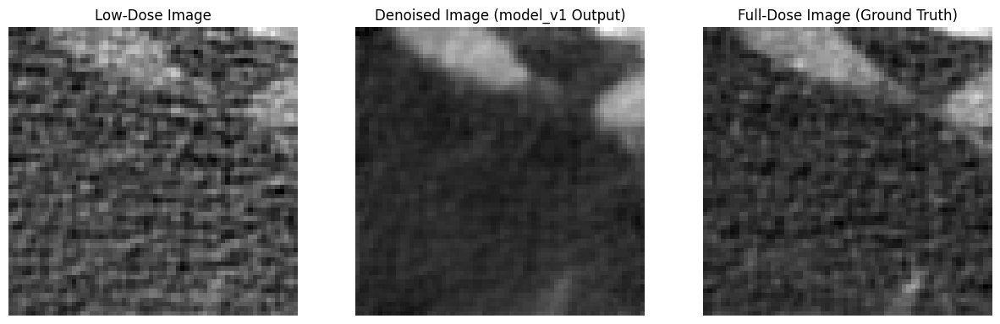

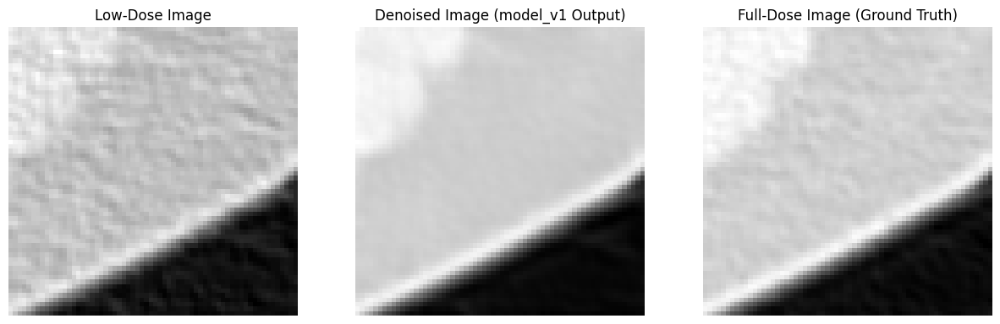

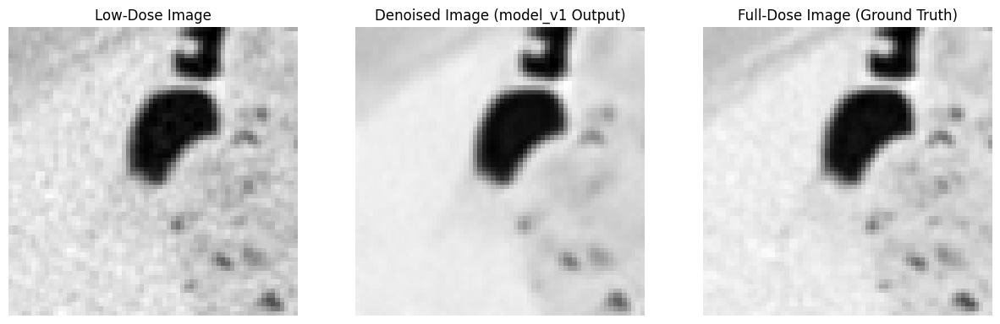

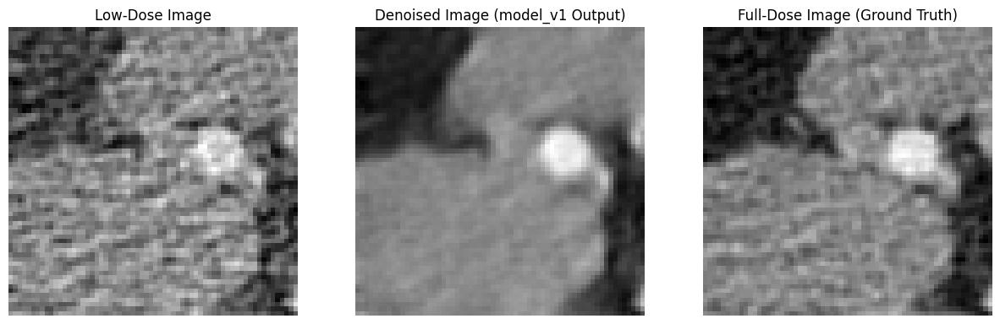

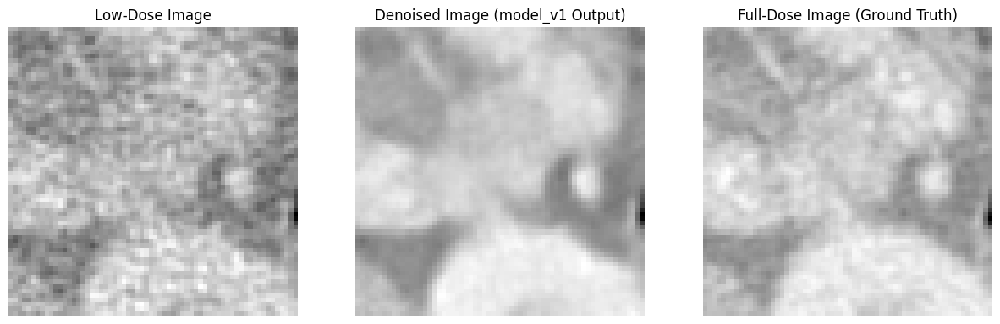

In [29]:
# Visualize the results
visualize_denoised_images(model, train_loader, num_images=5)


# Testing

In [30]:
# Define the CTDataset (assuming it's already defined in the main code)

# Define the paths for full-dose and low-dose data
full_dose_base_dir = '/kaggle/input/mayo-dataset/full_1mm/'
low_dose_base_dir = '/kaggle/input/mayo-dataset/quarter_1mm/'

# Define test patients (use patients not seen during training)
test_patients = ['L109', 'L143']  # Example test patients

# Create the test dataset
test_dataset = CTDataset(test_patients, full_dose_base_dir, low_dose_base_dir)

# Create DataLoader for the test dataset
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)


In [33]:
from tqdm import tqdm  # Import tqdm for progress bar
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# Function to load the model (assuming the function load_model is defined)
model_save_path = '/kaggle/input/ldct_v1/pytorch/default/1/LDCT Denoising Model.pth'

# Load the model for evaluation
model = load_model(model_save_path, model_v1().to(device))


# Function to test the model and compare before and after denoising with progress bar
def test_model_with_comparison(model, test_loader):
    model.eval()  # Set model to evaluation mode
    test_loss = 0.0
    
    psnr_before_denoising = []
    psnr_after_denoising = []
    ssim_before_denoising = []
    ssim_after_denoising = []
    
    with torch.no_grad():  # Disable gradient calculation for testing
        # Wrap the DataLoader with tqdm to display the progress
        for low_batch, full_batch in tqdm(test_loader, desc="Testing Progress", unit="batch"):
            low_batch, full_batch = low_batch.to(device), full_batch.to(device)
            
            # Forward pass: Generate denoised images
            outputs = model(low_batch)
            
            # Compute loss
            loss = criterion(outputs, full_batch)
            test_loss += loss.item()
            
            # Move tensors to CPU and convert to numpy arrays
            low_batch_np = low_batch.cpu().numpy()
            outputs_np = outputs.cpu().numpy()
            full_batch_np = full_batch.cpu().numpy()
            
            # Compute PSNR and SSIM for each sample in the batch
            for i in range(low_batch_np.shape[0]):
                # PSNR and SSIM before denoising (Low-dose vs Full-dose)
                psnr_value_before = psnr(full_batch_np[i, 0], low_batch_np[i, 0], data_range=1.0)
                ssim_value_before = ssim(full_batch_np[i, 0], low_batch_np[i, 0], data_range=1.0)
                psnr_before_denoising.append(psnr_value_before)
                ssim_before_denoising.append(ssim_value_before)
                
                # PSNR and SSIM after denoising (Denoised vs Full-dose)
                psnr_value_after = psnr(full_batch_np[i, 0], outputs_np[i, 0], data_range=1.0)
                ssim_value_after = ssim(full_batch_np[i, 0], outputs_np[i, 0], data_range=1.0)
                psnr_after_denoising.append(psnr_value_after)
                ssim_after_denoising.append(ssim_value_after)
    
    # Compute averages
    avg_test_loss = test_loss / len(test_loader)
    avg_psnr_before = np.mean(psnr_before_denoising)
    avg_ssim_before = np.mean(ssim_before_denoising)
    avg_psnr_after = np.mean(psnr_after_denoising)
    avg_ssim_after = np.mean(ssim_after_denoising)
    
    print(f"\nTest Loss: {avg_test_loss:.8f}")
    print(f"Average PSNR Before Denoising: {avg_psnr_before:.4f} dB")
    print(f"Average SSIM Before Denoising: {avg_ssim_before:.4f}")
    print(f"Average PSNR After Denoising: {avg_psnr_after:.4f} dB")
    print(f"Average SSIM After Denoising: {avg_ssim_after:.4f}")
    
    return avg_test_loss, avg_psnr_before, avg_ssim_before, avg_psnr_after, avg_ssim_after

# Run the testing with progress bar
test_loss, avg_psnr_before, avg_ssim_before, avg_psnr_after, avg_ssim_after = test_model_with_comparison(model, test_loader)


/tmp/ipykernel_949/2254125103.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model loaded from /kaggle/input/ldct_v1/pytorch/default/1/LDCT Denoising Model.pth


Testing Progress: 100%|██████████| 1806/1806 [01:40<00:00, 18.03batch/s]


Test Loss: 0.00016618
Average PSNR Before Denoising: 35.7693 dB
Average SSIM Before Denoising: 0.8306
Average PSNR After Denoising: 39.9652 dB
Average SSIM After Denoising: 0.9334


# To see the results from the model

In [42]:
import os
import random
import numpy as np
import torch
import pydicom
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import matplotlib.pyplot as plt
from tqdm import tqdm

# Load Original Image (Low-Dose)
def load_original_image(image_path):
    dicom_data = pydicom.dcmread(image_path)
    pixel_array = dicom_data.pixel_array
    normalized_image = (pixel_array - np.min(pixel_array)) / (np.max(pixel_array) - np.min(pixel_array))
    return normalized_image

# Match and Load Full-Dose Image (Ground Truth) based on low-dose filename
def load_full_dose_image(patient_id, full_dose_base_dir, low_dose_file):
    full_dose_dir = os.path.join(full_dose_base_dir, patient_id, 'full_1mm/')
    
    # Extract the unique part of the filename (e.g., indices/timestamp) to match
    unique_identifier = low_dose_file.split('_')[3:]  # Assuming identifier starts after patient ID, modify as needed
    
    # Get all full-dose files and try to match the identifier
    full_dose_files = [f for f in os.listdir(full_dose_dir) if f.endswith('.IMA')]
    for full_file in full_dose_files:
        if '_'.join(unique_identifier) in full_file:
            full_image_path = os.path.join(full_dose_dir, full_file)
            return load_original_image(full_image_path)
    
    # If no match is found, return None or handle error
    print(f"No matching full-dose image found for low-dose file: {low_dose_file}")
    return None

# Extract Patches
def extract_patches(image, patch_size=64, stride=64):
    patches = view_as_windows(image, (patch_size, patch_size), step=stride)
    patches = patches.reshape(-1, patch_size, patch_size)
    return patches

# Reconstruct Full Image from Patches
def reconstruct_image(patches, image_shape, patch_size=64, stride=64):
    full_image = np.zeros(image_shape)  # Initialize the full image
    count_map = np.zeros(image_shape)  # Count map for averaging overlapping areas
    
    # Iterate over each patch and add it to the appropriate location in the full image
    patch_idx = 0
    for i in range(0, image_shape[0] - patch_size + 1, stride):
        for j in range(0, image_shape[1] - patch_size + 1, stride):
            full_image[i:i+patch_size, j:j+patch_size] += patches[patch_idx]
            count_map[i:i+patch_size, j:j+patch_size] += 1
            patch_idx += 1

    # Average the overlapping areas
    full_image /= count_map
    return full_image

# Function to Denoise Patches using the trained model
def denoise_patches(model, patches):
    model.eval()
    denoised_patches = []
    
    with torch.no_grad():
        for patch in patches:
            patch_tensor = torch.tensor(patch).unsqueeze(0).unsqueeze(0).float().to(device)  # Shape: (1, 1, 64, 64)
            denoised_patch = model(patch_tensor)  # Generate denoised patch
            
            # Ensure the output is squeezed to remove the extra dimension
            denoised_patches.append(denoised_patch.cpu().numpy().squeeze())  # Store without extra dimensions
    
    return np.array(denoised_patches)

# Visualization Function with PSNR and SSIM
def visualize_images(original_image, denoised_image, full_dose_image):
    # Calculate the noise images
    noise_ldct = original_image - full_dose_image
    noise_denoised = original_image - denoised_image

    # Calculate PSNR and SSIM for the LDCT and denoised image
    psnr_ldct = psnr(full_dose_image, original_image, data_range=1.0)
    psnr_denoised = psnr(full_dose_image, denoised_image, data_range=1.0)
    ssim_ldct = ssim(full_dose_image, original_image, data_range=1.0)
    ssim_denoised = ssim(full_dose_image, denoised_image, data_range=1.0)

    # Plotting
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))

    # Row 1: Original, Denoised, and Full-Dose
    axs[0, 0].imshow(original_image, cmap='gray')
    axs[0, 0].set_title("Original Low-Dose Image")
    axs[0, 0].axis('off')

    axs[0, 1].imshow(denoised_image, cmap='gray')
    axs[0, 1].set_title("Denoised Image")
    axs[0, 1].axis('off')

    axs[0, 2].imshow(full_dose_image, cmap='gray')
    axs[0, 2].set_title("Full-Dose Image (Ground Truth)")
    axs[0, 2].axis('off')

    # Row 2: Noise after subtraction and metrics
    axs[1, 0].imshow(noise_ldct, cmap='gray')
    axs[1, 0].set_title(f"Noise (LDCT - NDCT)\nPSNR: {psnr_ldct:.2f} dB, SSIM: {ssim_ldct:.4f}")
    axs[1, 0].axis('off')

    axs[1, 1].imshow(noise_denoised, cmap='gray')
    axs[1, 1].set_title(f"Noise (LDCT - Denoised)\nPSNR: {psnr_denoised:.2f} dB, SSIM: {ssim_denoised:.4f}")
    axs[1, 1].axis('off')

    plt.show()

# Function to randomly select and process a low-dose image for each patient
def random_select_image(patient_id, low_dose_base_dir):
    # Get list of all files in the directory
    low_dose_dir = os.path.join(low_dose_base_dir, patient_id, 'quarter_1mm/')
    files = [f for f in os.listdir(low_dose_dir) if f.endswith('.IMA')]
    
    if files:
        # Randomly select one file
        selected_file = random.choice(files)
        return os.path.join(low_dose_dir, selected_file), selected_file
    else:
        print(f"No files available for patient {patient_id}")
        return None, None

# Process and visualize randomly selected images for each patient
def process_and_visualize_random_images(patient_ids, low_dose_base_dir, full_dose_base_dir, model):
    for patient_id in tqdm(patient_ids, desc="Processing Patients", unit="patient"):
        # Randomly select a low-dose image
        original_image_path, low_dose_file = random_select_image(patient_id, low_dose_base_dir)
        
        if original_image_path:  # Proceed only if a valid image was found
            original_image = load_original_image(original_image_path)
            
            # Load the corresponding full-dose image (Ground Truth)
            full_dose_image = load_full_dose_image(patient_id, full_dose_base_dir, low_dose_file)
            
            if full_dose_image is None:
                print(f"Skipping patient {patient_id} due to mismatch.")
                continue  # Skip to the next patient if no matching full-dose image is found
            
            # Extract patches from the original image
            original_patches = extract_patches(original_image)
            
            # Denoise the original patches
            denoised_patches = denoise_patches(model, original_patches)
            
            # Reconstruct the denoised full image
            reconstructed_image = reconstruct_image(denoised_patches, original_image.shape)
            
            # Visualize the results with PSNR and SSIM
            visualize_images(original_image, reconstructed_image, full_dose_image)

# Example execution with patient IDs
full_dose_base_dir = '/kaggle/input/mayo-dataset/full_1mm/'
low_dose_base_dir = '/kaggle/input/mayo-dataset/quarter_1mm/'

# List of patient IDs to process
patient_ids = ['L310', 'L333']  # Add more patient IDs as needed

# Process and visualize the randomly selected images for all patients
# process_and_visualize_random_images(patient_ids, low_dose_base_dir, full_dose_base_dir, model)






### Matching paths of ldct and ndct to make it easier


In [38]:
import os
import numpy as np

# Base directories for low-dose and high-dose images
full_dose_base_dir = '/kaggle/input/mayo-dataset/full_1mm/'
low_dose_base_dir = '/kaggle/input/mayo-dataset/quarter_1mm/'

# List of patient IDs
patient_ids = ['L310', 'L333', 'L506']  # Add more patient IDs as needed

# Function to get matching low-dose and full-dose paths
def get_matching_paths(patient_ids, low_dose_base_dir, full_dose_base_dir):
    matching_paths = []
    
    for patient_id in patient_ids:
        # Paths to the patient's low-dose and full-dose directories
        low_dose_dir = os.path.join(low_dose_base_dir, patient_id, 'quarter_1mm/')
        full_dose_dir = os.path.join(full_dose_base_dir, patient_id, 'full_1mm/')
        
        # Get list of DICOM files for low-dose and full-dose
        low_dose_files = sorted([f for f in os.listdir(low_dose_dir) if f.endswith('.IMA')])
        full_dose_files = sorted([f for f in os.listdir(full_dose_dir) if f.endswith('.IMA')])
        
        # Ensure that both directories have the same number of files
        if len(low_dose_files) != len(full_dose_files):
            print(f"Warning: Number of low-dose and full-dose files do not match for patient {patient_id}. Skipping this patient.")
            continue
        
        # Pair each low-dose file with the corresponding full-dose file
        for low_file, full_file in zip(low_dose_files, full_dose_files):
            low_dose_path = os.path.join(low_dose_dir, low_file)
            full_dose_path = os.path.join(full_dose_dir, full_file)
            matching_paths.append([low_dose_path, full_dose_path])
    
    return np.array(matching_paths)

# Generate the array of matching paths
matching_paths_array = get_matching_paths(patient_ids, low_dose_base_dir, full_dose_base_dir)

# # Print the array (low-dose path, full-dose path)
# for paths in matching_paths_array:
#     print(f"Low-Dose Path: {paths[0]}\nFull-Dose Path: {paths[1]}\n")

print(matching_paths_array)


[['/kaggle/input/mayo-dataset/quarter_1mm/L310/quarter_1mm/L310_QD_1_1.CT.0003.0001.2015.12.22.18.04.55.889861.358231808.IMA'
  '/kaggle/input/mayo-dataset/full_1mm/L310/full_1mm/L310_FD_1_1.CT.0001.0001.2015.12.22.18.00.49.960270.358097511.IMA']
 ['/kaggle/input/mayo-dataset/quarter_1mm/L310/quarter_1mm/L310_QD_1_1.CT.0003.0002.2015.12.22.18.04.55.889861.358231832.IMA'
  '/kaggle/input/mayo-dataset/full_1mm/L310/full_1mm/L310_FD_1_1.CT.0001.0002.2015.12.22.18.00.49.960270.358097535.IMA']
 ['/kaggle/input/mayo-dataset/quarter_1mm/L310/quarter_1mm/L310_QD_1_1.CT.0003.0003.2015.12.22.18.04.55.889861.358231856.IMA'
  '/kaggle/input/mayo-dataset/full_1mm/L310/full_1mm/L310_FD_1_1.CT.0001.0003.2015.12.22.18.00.49.960270.358097559.IMA']
 ...
 ['/kaggle/input/mayo-dataset/quarter_1mm/L506/quarter_1mm/L506_QD_1_1.CT.0004.0524.2015.12.22.20.46.00.71702.358814493.IMA'
  '/kaggle/input/mayo-dataset/full_1mm/L506/full_1mm/L506_FD_1_1.CT.0002.0524.2015.12.22.20.19.52.894480.358619571.IMA']
 ['/kagg

In [39]:
import random
import numpy as np
import torch
import pydicom
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import matplotlib.pyplot as plt
from tqdm import tqdm
from skimage.util import view_as_windows

# Load Original Image (Low-Dose)
def load_original_image(image_path):
    dicom_data = pydicom.dcmread(image_path)
    pixel_array = dicom_data.pixel_array
    normalized_image = (pixel_array - np.min(pixel_array)) / (np.max(pixel_array) - np.min(pixel_array))
    return normalized_image

# Extract Patches
def extract_patches(image, patch_size=64, stride=64):
    patches = view_as_windows(image, (patch_size, patch_size), step=stride)
    patches = patches.reshape(-1, patch_size, patch_size)
    return patches

# Reconstruct Full Image from Patches
def reconstruct_image(patches, image_shape, patch_size=64, stride=64):
    full_image = np.zeros(image_shape)  # Initialize the full image
    count_map = np.zeros(image_shape)  # Count map for averaging overlapping areas
    
    # Iterate over each patch and add it to the appropriate location in the full image
    patch_idx = 0
    for i in range(0, image_shape[0] - patch_size + 1, stride):
        for j in range(0, image_shape[1] - patch_size + 1, stride):
            full_image[i:i + patch_size, j:j + patch_size] += patches[patch_idx]
            count_map[i:i + patch_size, j:j + patch_size] += 1
            patch_idx += 1

    # Average the overlapping areas
    full_image /= count_map
    return full_image

# Function to Denoise Patches using the trained model
def denoise_patches(model, patches):
    model.eval()
    denoised_patches = []
    
    with torch.no_grad():
        for patch in patches:
            patch_tensor = torch.tensor(patch).unsqueeze(0).unsqueeze(0).float().to(device)  # Shape: (1, 1, 64, 64)
            denoised_patch = model(patch_tensor)  # Generate denoised patch
            
            # Ensure the output is squeezed to remove the extra dimension
            denoised_patches.append(denoised_patch.cpu().numpy().squeeze())  # Store without extra dimensions
    
    return np.array(denoised_patches)

# Visualization Function with PSNR and SSIM
def visualize_images(original_image, denoised_image, full_dose_image):
    # Calculate the noise images
    noise_ldct = original_image - full_dose_image
    noise_denoised = original_image - denoised_image

    # Calculate PSNR and SSIM for the LDCT and denoised image
    psnr_ldct = psnr(full_dose_image, original_image, data_range=1.0)
    psnr_denoised = psnr(full_dose_image, denoised_image, data_range=1.0)
    ssim_ldct = ssim(full_dose_image, original_image, data_range=1.0)
    ssim_denoised = ssim(full_dose_image, denoised_image, data_range=1.0)

    # Plotting
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))

    # Row 1: Original, Denoised, and Full-Dose
    axs[0, 0].imshow(original_image, cmap='gray')
    axs[0, 0].set_title("Original Low-Dose Image")
    axs[0, 0].axis('off')

    axs[0, 1].imshow(denoised_image, cmap='gray')
    axs[0, 1].set_title("Denoised Image")
    axs[0, 1].axis('off')

    axs[0, 2].imshow(full_dose_image, cmap='gray')
    axs[0, 2].set_title("Full-Dose Image (Ground Truth)")
    axs[0, 2].axis('off')

    # Row 2: Noise after subtraction and metrics
    axs[1, 0].imshow(noise_ldct, cmap='gray')
    axs[1, 0].set_title(f"Noise (LDCT - NDCT)\nPSNR: {psnr_ldct:.2f} dB, SSIM: {ssim_ldct:.4f}")
    axs[1, 0].axis('off')

    axs[1, 1].imshow(noise_denoised, cmap='gray')
    axs[1, 1].set_title(f"Noise (LDCT - Denoised)\nPSNR: {psnr_denoised:.2f} dB, SSIM: {ssim_denoised:.4f}")
    axs[1, 1].axis('off')

    plt.show()

# Process and visualize images from the paths array
def process_and_visualize_images_from_pairs(paths_array, model):
    # Ensure paths_array is a list of lists
    if isinstance(paths_array, np.ndarray):
        paths_array = paths_array.tolist()  # Convert to list if it's a NumPy array

    # Randomly select 5 pairs from the paths array
    selected_pairs = random.sample(paths_array, 5)  # Adjust this number as needed

    for paths in tqdm(selected_pairs, desc="Processing Images", unit="image"):
        low_dose_path = paths[0]
        full_dose_path = paths[1]
        
        # Load the low-dose and full-dose images
        original_image = load_original_image(low_dose_path)
        full_dose_image = load_original_image(full_dose_path)
        
        # Extract patches from the original image
        original_patches = extract_patches(original_image)
        
        # Denoise the original patches
        denoised_patches = denoise_patches(model, original_patches)
        
        # Reconstruct the denoised full image
        reconstructed_image = reconstruct_image(denoised_patches, original_image.shape)
        
        # Visualize the results with PSNR and SSIM
        visualize_images(original_image, reconstructed_image, full_dose_image)




Processing Images:   0%|          | 0/5 [00:00<?, ?image/s]

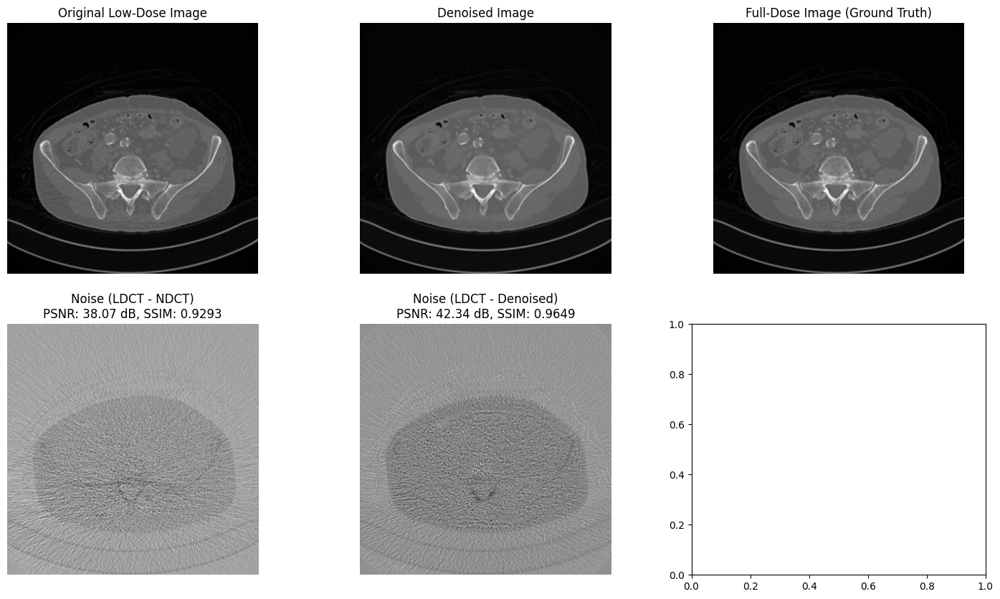

Processing Images:  20%|██        | 1/5 [00:01<00:05,  1.31s/image]

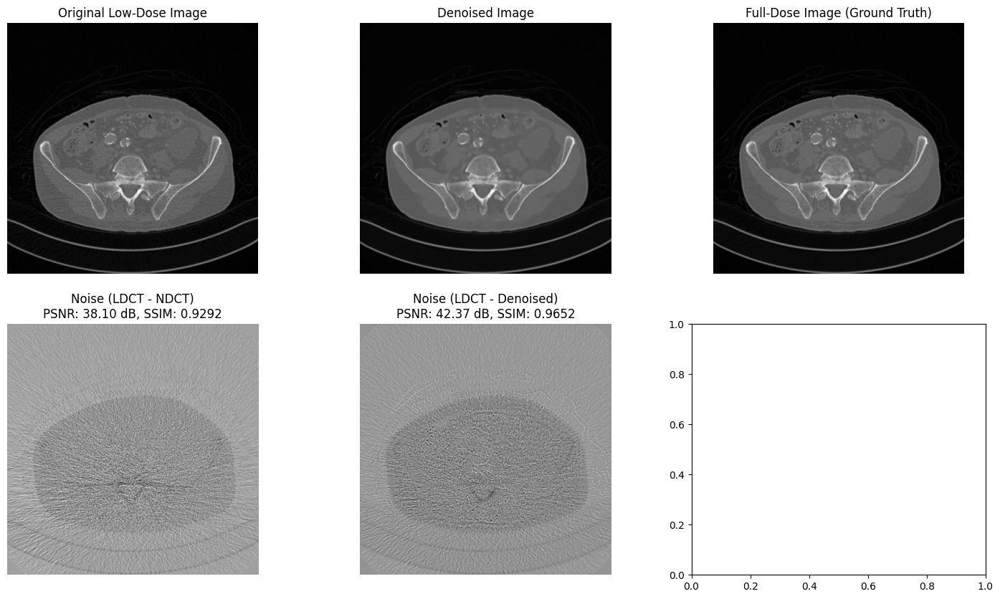

Processing Images:  40%|████      | 2/5 [00:02<00:03,  1.21s/image]

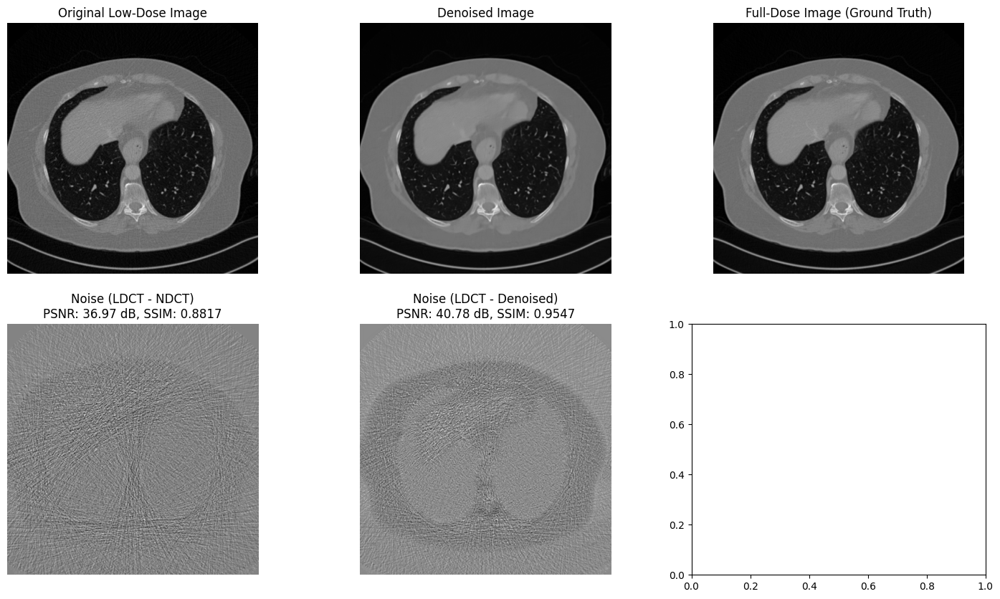

Processing Images:  60%|██████    | 3/5 [00:03<00:02,  1.18s/image]

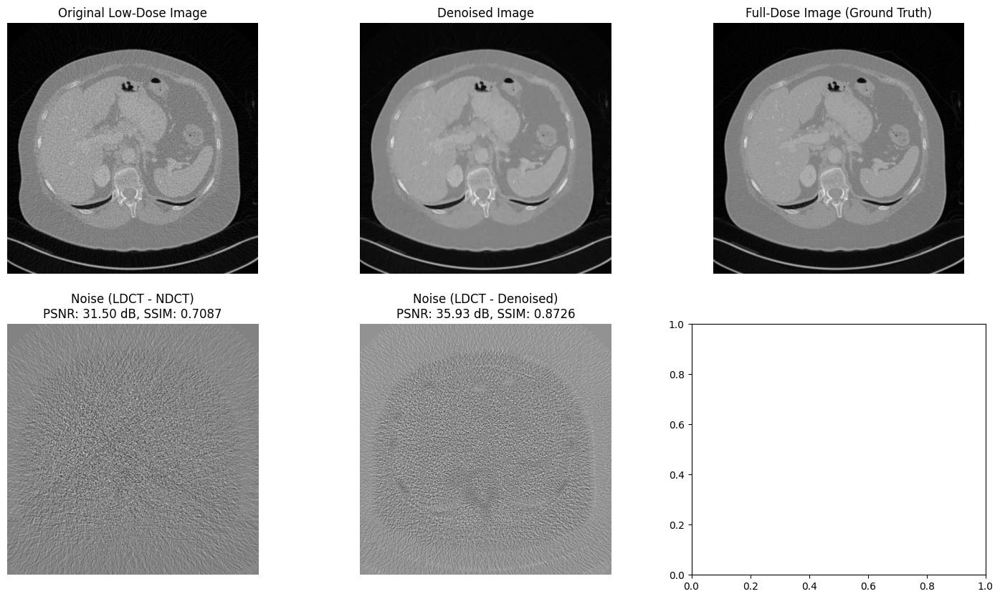

Processing Images:  80%|████████  | 4/5 [00:04<00:01,  1.18s/image]

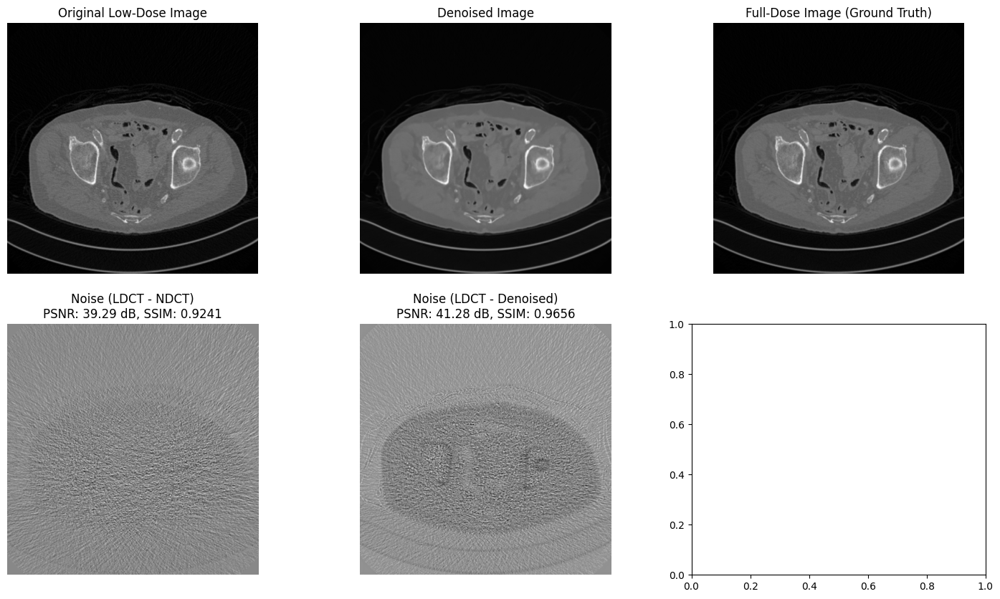

Processing Images: 100%|██████████| 5/5 [00:05<00:00,  1.17s/image]


In [40]:
# Process and visualize the randomly selected images for the pairs
process_and_visualize_images_from_pairs(matching_paths_array, model)

# Diffusion

In [ ]:
!pip install torch torchvision pydicom scikit-image matplotlib tqdm


In [ ]:
import torch
import torch.nn as nn

# U-Net Architecture typically used in diffusion models
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, features=[64, 128, 256, 512]):
        super(UNet, self).__init__()
        
        # Encoder (Downsampling)
        self.encoder = nn.ModuleList()
        for feature in features:
            self.encoder.append(self._block(in_channels, feature))
            in_channels = feature

        # Bottleneck
        self.bottleneck = self._block(features[-1], features[-1] * 2)

        # Decoder (Upsampling)
        self.decoder = nn.ModuleList()
        for feature in reversed(features):
            self.decoder.append(
                nn.ConvTranspose2d(feature * 2, feature, kernel_size=2, stride=2)
            )
            self.decoder.append(self._block(feature * 2, feature))

        # Final Convolution
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def _block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
        )

    def forward(self, x):
        # Encoder path
        enc_features = []
        for enc in self.encoder:
            x = enc(x)
            enc_features.append(x)
            x = nn.MaxPool2d(kernel_size=2)(x)
        
        # Bottleneck
        x = self.bottleneck(x)

        # Decoder path
        for i in range(0, len(self.decoder), 2):
            x = self.decoder[i](x)  # Upsample
            enc_feature = enc_features[-(i//2)-1]
            x = torch.cat((x, enc_feature), dim=1)
            x = self.decoder[i + 1](x)  # Convolve
        
        return self.final_conv(x)
